# Advanced-Lane-Lines Project

## Init

In [1]:
import os, sys
import numpy as np
import cv2
import pickle
import glob
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# pretty formatting of np float arrays
float_formatter = lambda x: "%10.4f" % x
np.set_printoptions(formatter={'float_kind' : float_formatter})


#############################################################################
# Constants and variables
#############################################################################

# Turns debugging images on
image_output= True 

# Plot size for plotting images with matplotlib in inches
plot_size = (12, 12)

# amount of corners on chessboard pattern
nx, ny = 9, 6
cam_calib_file = "cam_calib_params.p"

# list of calibration images
calib_files = glob.glob("./camera_cal/calibration*.jpg")
test_files  = glob.glob("./test_images/*.jpg")

# Parameters for ROI selection
roi_height = 0.6
dist_from_side = 0.48 # realtive to image width, max. value: 0.5 -> triangle
ignore_mask_color = 255



# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None


## Helper functions
Some of them have been used during *P2 - Finding lane*.

In [2]:
def ransac_polyfit(x, y, order=3, n=10, k=100, t=0.1, d=100, f=0.8):
    # Thanks https://en.wikipedia.org/wiki/Random_sample_consensus
    # n – minimum number of data points required to fit the model
    # k – maximum number of iterations allowed in the algorithm
    # t – threshold value to determine when a data point fits a model
    # d – number of close data points required to assert that a model fits well to data
    # f – fraction of close data points required

    besterr = np.inf
    bestfit = []
    for kk in range(k):
        maybeinliers = random.sample(range(len(x)), int(n)) #np.random.randint(x.size, size=n)
        maybemodel = np.polyfit(x[maybeinliers], y[maybeinliers], order)
        print("maybemodel: ",maybemodel)
        alsoinliers = np.abs(np.polyval(maybemodel, x)-y) < t
        if sum(alsoinliers) > d and sum(alsoinliers) > len(x)*f:
            bettermodel = np.polyfit(x[alsoinliers], y[alsoinliers], order)
            print("bettermodel: ", bettermodel)
            thiserr = np.sum(np.abs(np.polyval(bettermodel, x[alsoinliers])-y[alsoinliers]))
            if thiserr < besterr:
                bestfit = bettermodel
                besterr = thiserr

    print("run ransac for %d iterations" % kk)
    return bestfit



def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)


def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    return cv2.bitwise_and(img, mask)


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

# Python 3 has support for cool math symbols.
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


def filter_and_extrapolate_lines(lines, image, slope_threshold_low = 0.5, slope_threshold_high = 0.8, verbose=False):
    """
    Filter out lines and assign lines to the left or right lane group according to their slope.
    The line equation is: y = m*x + b
    When we detect a line with a positive slope and a value greater than the pos_threshold
    it gets assigned to the left group, if the slope is negative and smaller than the negative
    threshold it gets assigned to the right group.
    
    At the end we do a linear regression line fitting for both the left and right lane lines.
    """

    if len(lines) == 0:
        print("No lines in array!")
        return []

    if verbose: 
        print("Extracting lane from %d lines" % len(lines))
    
    lane_lines  = []
    left_idx    = []
    right_idx   = []
    outlier_cnt = 0
    
    minimum_y = image.shape[0] 
    maximum_y = image.shape[0]

    # filter out lines and assign them to the left or right lane group
    for i, line in enumerate(lines):
        for x1,y1,x2,y2 in line:
            deltX = x2-x1
            deltY = y2-y1
            slope = deltY / deltX
            length = np.sqrt(deltX**2 + deltY**2)
            # TODO: use also length as criterion for line selection...

            # if positive slope, assign to right lane group
            if (slope > slope_threshold_low and slope < slope_threshold_high): 
                if verbose: print("\tFound left lane line with slope=%.2f and length=%.2f" % (slope, length)) 
                right_idx.append(i)

            # if negative slope, assign to left lane group
            elif (slope < -slope_threshold_low and slope > -slope_threshold_high): 
                if verbose: print("\tFound right lane line with slope=%.2f and length=%.2f" % (slope, length))
                left_idx.append(i)

            # this must be an outlier
            else:
                if verbose: print("\tFound outlier line with slope=%.2f and length=%.2f" % (slope, length))
                outlier_cnt+=1

            # update the min y (horizon)
            minimum_y = min(min(y1, y2), minimum_y)

    if verbose:
        print("Result: %d left, %d right and %d outlier detected" % (len(left_idx), len(right_idx), outlier_cnt))

    if len(right_idx) == 0 or len(left_idx) == 0:
        print("Couldn't detect both road lanes in the list of lines, %d left and %d right :(" % \
             (len(left_idx), len(right_idx)))
        return []

    # pick out xs and ys from lines array
    left_xs  = np.array(lines[left_idx][:, :, 0:3:2]).flatten()
    left_ys  = np.array(lines[left_idx][:, :, 1:4:2]).flatten()
    right_xs = np.array(lines[right_idx][:, :, 0:3:2]).flatten()
    right_ys = np.array(lines[right_idx][:, :, 1:4:2]).flatten()
    
    # run linear regression for line fitting over collected points for both left and right lane
    left_slope,  left_intercept  = np.polyfit(left_xs,  left_ys, 1)
    #ransac_polyfit(left_xs, left_ys, order=1, n=left_xs.size//2, k=left_xs.size//2, d=left_xs.size//2, t=0.4)
    right_slope, right_intercept = np.polyfit(right_xs, right_ys, 1)
    #ransac_polyfit(right_xs, right_ys, order=1, n=left_xs.size//2, k=left_xs.size//2, d=left_xs.size//2, t=0.4)
    # def ransac_polyfit(x, y, order=3, n=20, k=100, t=0.1, d=100, f=0.8)
    
    # calculate pixel coordinates to describe the left and right lane line
    left_x1  = int((minimum_y - left_intercept)  / left_slope)
    left_x2  = int((maximum_y - left_intercept)  / left_slope)
    right_x1 = int((minimum_y - right_intercept) / right_slope)
    right_x2 = int((maximum_y - right_intercept) / right_slope)

    # define the final found lines based on two points and return them
    lane_lines.append([[left_x1,  minimum_y, left_x2,  maximum_y]])
    lane_lines.append([[right_x1, minimum_y, right_x2, maximum_y]])

    return lane_lines


def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    ysize = image.shape[0]
    xsize = image.shape[1]
    line_img = np.zeros(image.shape, dtype=np.uint8)
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    # first smooth image to get better results during edge detection
    img = gaussian_blur(S, kernel_size)
    gray = canny(img, canny_low_threshold, canny_high_threshold)

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),   \
                          (xsize*dist_from_side,     ysize*roi_height), \
                          (xsize*(1-dist_from_side), ysize*roi_height), \
                          (xsize,                    ysize) \
                         ]], dtype=np.int32)
    masked_img = region_of_interest(gray, vertices)

    # extracting straight lines from edges
    lines = cv2.HoughLinesP(masked_img, hough_rho, hough_theta, hough_threshold, np.array([]), \
                            hough_min_line_len, hough_max_line_gap)

    if annotate_all_lines:
        draw_lines(line_img, lines, color=[0, 255, 0], thickness=4)
    lines2 = filter_and_extrapolate_lines(lines, image, slope_threshold_low, slope_threshold_high, verbose=False)

    draw_lines(line_img, lines2, color=[255, 0, 0], thickness=10)
    combined_img = weighted_img(line_img, image)
    return combined_img

## Camera calibration

In [3]:
if not os.path.isfile(cam_calib_file):
    # Do a fresh cam calibration!
    
    # 3D points in real world space:
    objpoints = []
    # 2D points in image plane:
    imgpoints = []
    
    # Prepare object points like (0,0,0), ... (nx, ny, 0) for one chess calibration pattern
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:, 0:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    for file in calib_files:
        img = mpimg.imread(file)
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == False:
            print("Couldn't detect (%d, %d) corners in image %s" % (nx, ny, file))
            continue

        # if corners are found add object points and image points
        imgpoints.append(corners)
        objpoints.append(objp)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open(cam_calib_file, "wb" ) )

else:
    # load camera calibration parameters from pickle file
    with open(cam_calib_file, mode='rb') as f:
        dist_pickle = pickle.load(f)
    print("Loaded camera calibration from file %s" % cam_calib_file)

print(dist_pickle)

Loaded camera calibration from file cam_calib_params.p
{'dist': array([[   -0.2410,    -0.0531,    -0.0012,    -0.0001,     0.0267]]), 'mtx': array([[ 1153.9609,     0.0000,   669.7054],
       [    0.0000,  1148.0250,   385.6562],
       [    0.0000,     0.0000,     1.0000]])}


** Visualizing camera calibration **

Showing undistorted 5 random images from calibration dataset:


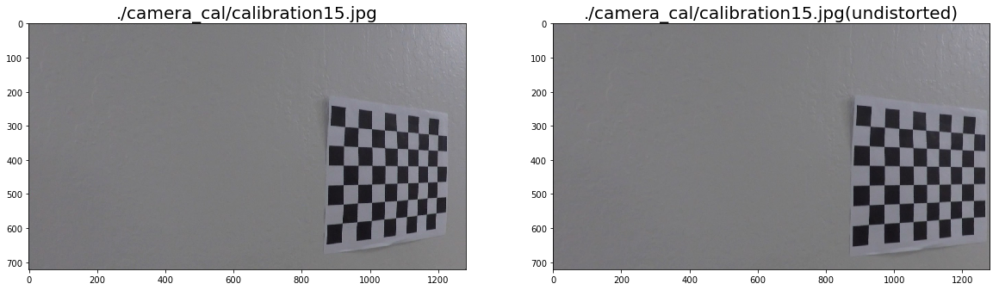

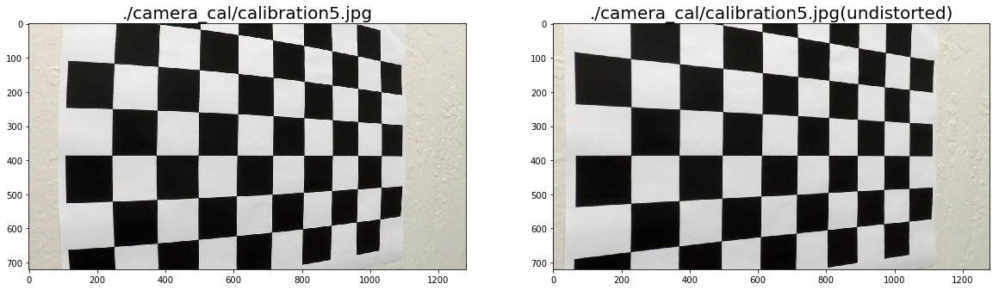

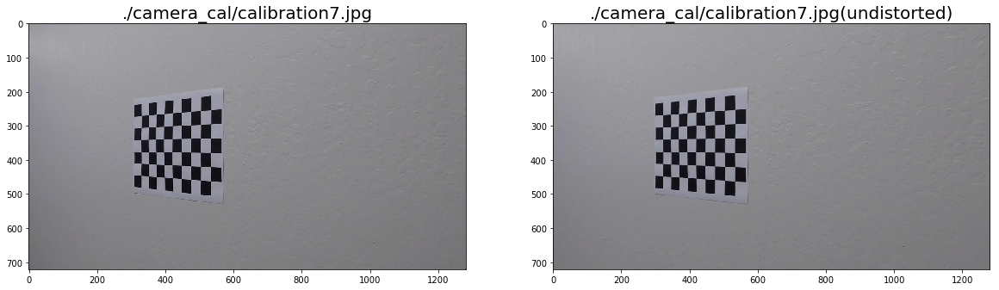

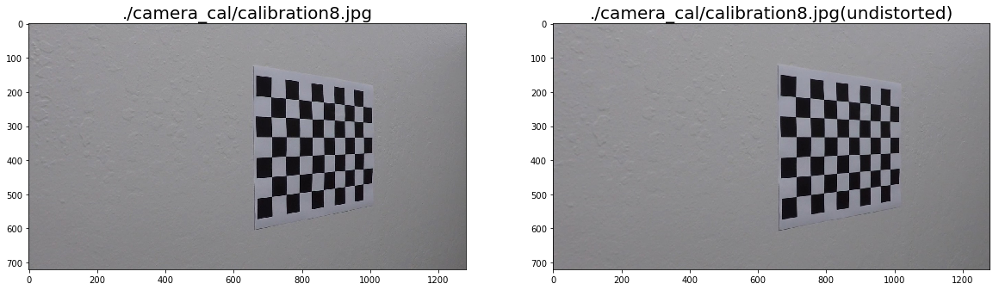

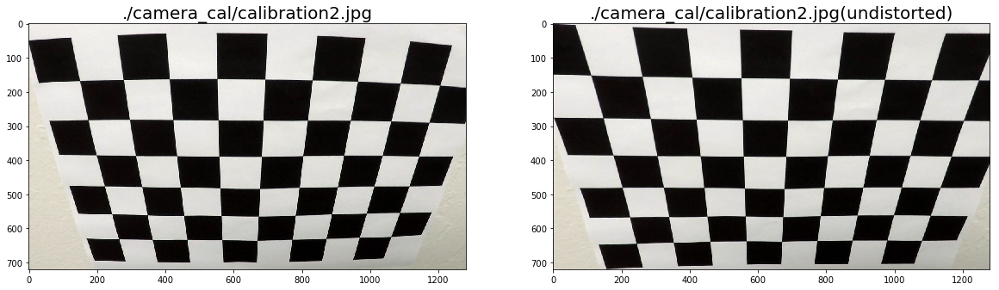

In [4]:
print("Showing undistorted 5 random images from calibration dataset:")
for file in random.sample(calib_files, 5):
    img = mpimg.imread(file)
    dst = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(file, fontsize=20)
    ax2.imshow(dst)
    ax2.set_title(file + "(undistorted)", fontsize=20)

    plt.show()

## Regin of interest masking

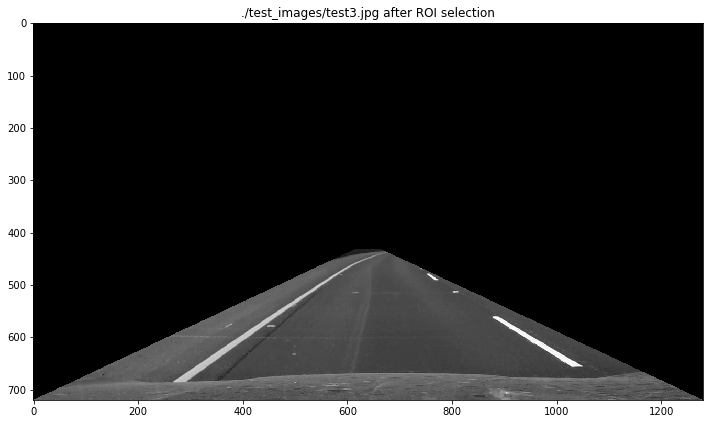

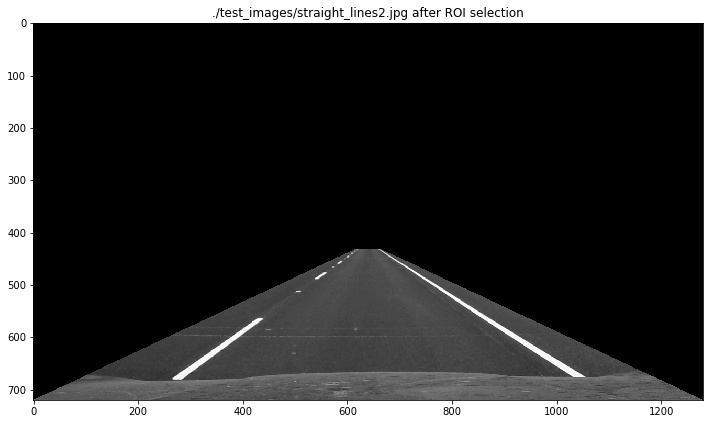

In [5]:
for file in random.sample(test_files, 2):
    img = mpimg.imread(file)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    xsize, ysize = (img.shape[1], img.shape[0])

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),   \
                          (xsize*dist_from_side,     ysize*roi_height), \
                          (xsize*(1-dist_from_side), ysize*roi_height), \
                          (xsize,                    ysize) \
                         ]], dtype=np.int32)

    masked_img = region_of_interest(gray, vertices)
    if image_output:
        fig = plt.figure(figsize=plot_size)
        plt.title(file + " after ROI selection")
        plt.imshow(masked_img, cmap='gray')
        plt.show()


## Using colourspaces

Use components of different colourspaces to be invariant against changes in colour and luminance, for example be invariant against road markings in different colours.

Using the *saturation* channel S in colourspace *HLS* has exactly this advantage, it is only describing the changes in saturation but very invariant against changes in luminance and hues / colours.
This channel is therefore used in edge detection.

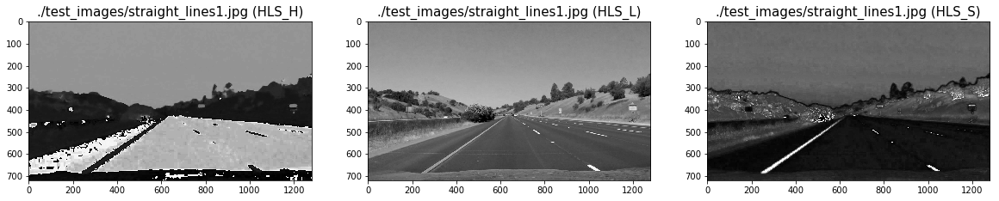

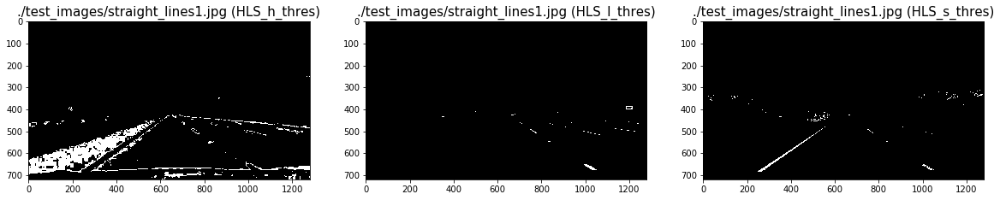

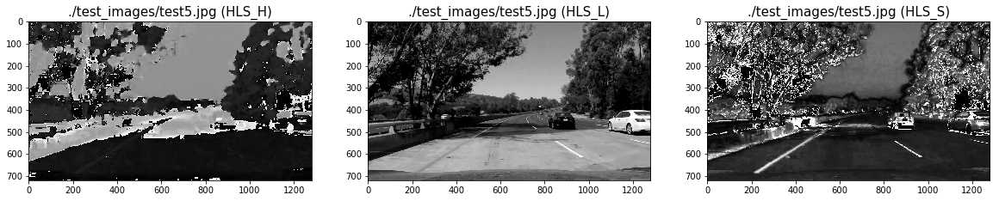

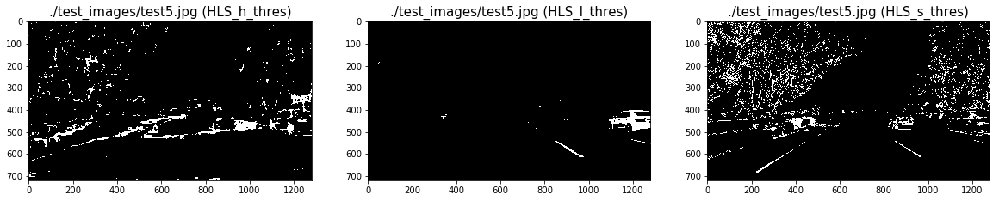

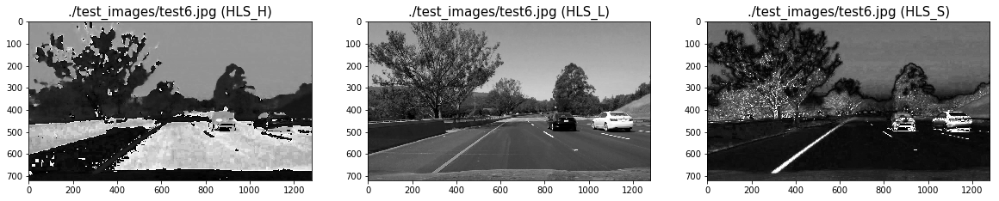

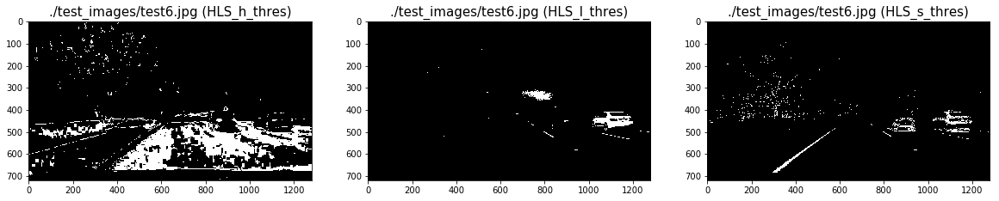

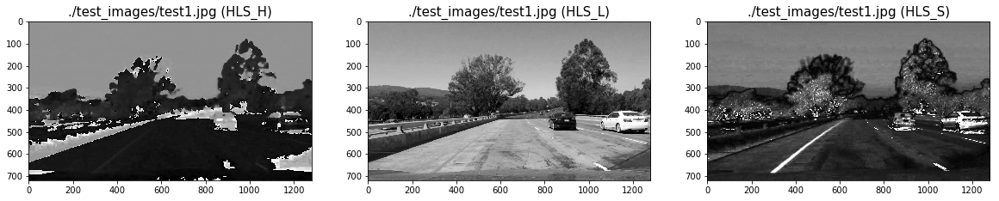

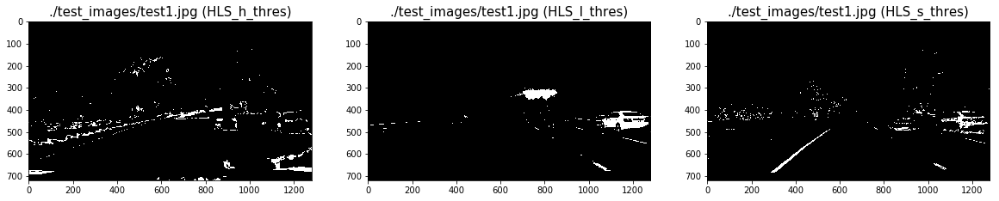

In [6]:
for file in random.sample(test_files, 4):
    img = mpimg.imread(file)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0] / np.max(hls[:,:,0])
    L = hls[:,:,1] / np.max(hls[:,:,1])
    S = hls[:,:,2] / np.max(hls[:,:,2])

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(H, cmap='gray')
    ax1.set_title(file + " (HLS_H)", fontsize=15)
    ax2.imshow(L, cmap='gray')
    ax2.set_title(file + " (HLS_L)", fontsize=15)
    ax3.imshow(S, cmap='gray')
    ax3.set_title(file + " (HLS_S)", fontsize=15)
    plt.show()
    
    thresh = (0.8, 1.0)
    binary_h = np.zeros_like(S)
    binary_l = np.zeros_like(S)
    binary_s = np.zeros_like(S)
    binary_h[(H > thresh[0]) & (H <= thresh[1])] = 1
    binary_l[(L > thresh[0]) & (L <= thresh[1])] = 1
    binary_s[(S > thresh[0]) & (S <= thresh[1])] = 1

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(binary_h, cmap='gray')
    ax1.set_title(file + " (HLS_h_thres)", fontsize=15)
    ax2.imshow(binary_l, cmap='gray')
    ax2.set_title(file + " (HLS_l_thres)", fontsize=15)
    ax3.imshow(binary_s, cmap='gray')
    ax3.set_title(file + " (HLS_s_thres)", fontsize=15)
    plt.show()

## Edge detection pipeline

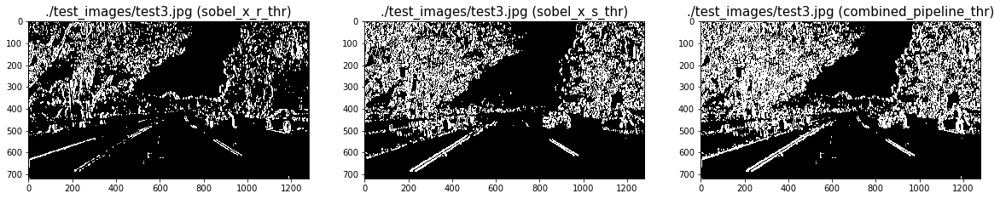

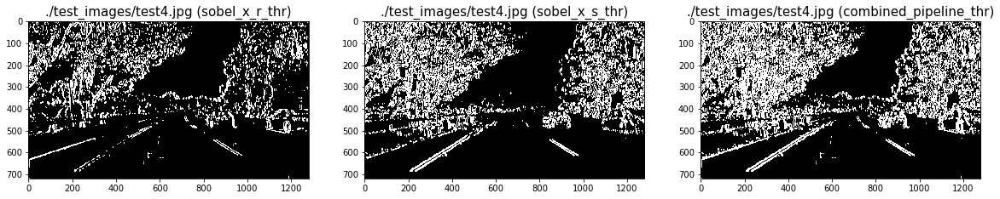

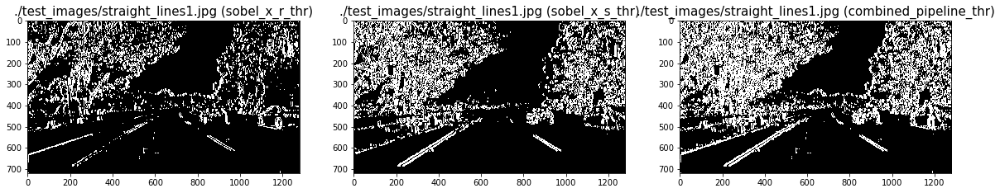

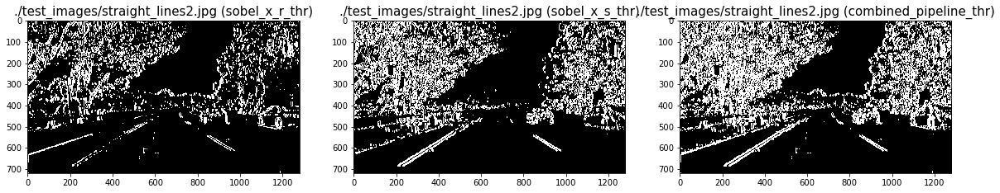

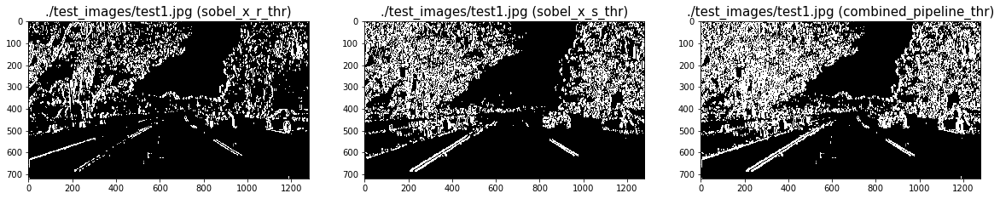

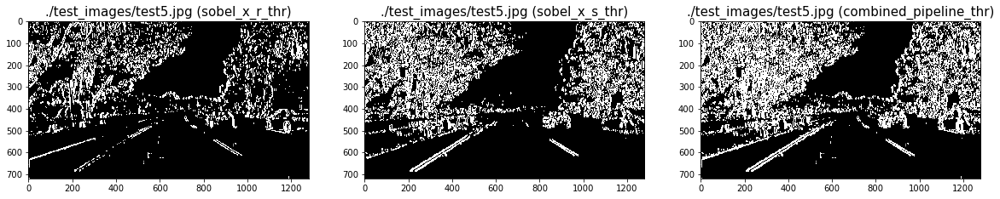

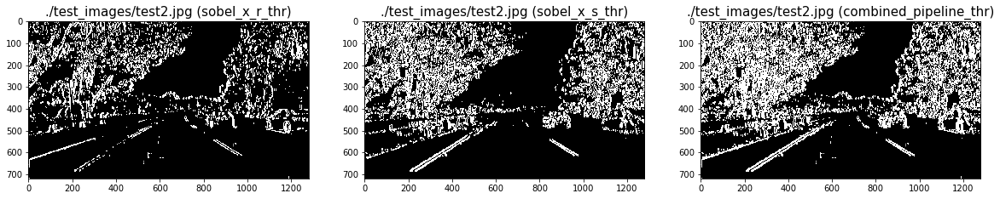

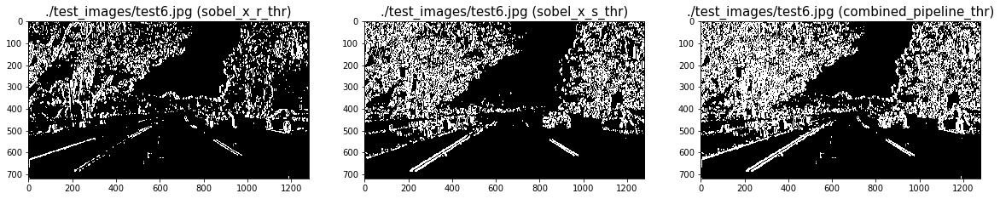

In [144]:
class segmentation():
    def __init__(self, config):
        """
        Params:
            ksize
                Kernel size for sobel filter.
                It should be a large odd number between [1 35] to smooth gradient measurements.
                
            sobel_thresh
                Threshold for normal sobel in x and y direction
                
            sobel_mag_thresh
                Threshold for magnitude sobel [sqrt(sobelx^2 + sobely^2)]
                
            sobel_dir_thresh
                Threshold for directional sobel filter in radians

            hls_s_thresh
                Threshold for S channel in HLS colourspace
        """
        self.set_config(config)
        
    def set_config(self, config):
        if "ksize" in config:
            self.ksize = config["ksize"]
        else:
            self.ksize = 31
        if "sobel_thresh" in config:
            self.sobel_thresh = config["sobel_thresh"]
        else:
            self.sobel_thresh = (0.11, 0.7)
        if "sobel_mag_thresh" in config:
            self.sobel_mag_thresh = config["sobel_mag_thresh"]
        else:
            self.sobel_mag_thresh = (0.11, 0.7)
        if "sobel_dir_thresh" in config:
            self.sobel_dir_thresh = config["sobel_dir_thresh"]
        else:
            self.sobel_dir_thresh = (np.pi/4, np.pi/2)
        if "hls_s_thresh" in config:
            self.hls_s_thresh = config["hls_s_thresh"]
        else:
            self.hls_s_thresh = (0.6, 1.0)


    def abs_sobel_thresh(self, image, orient='x'):
        if orient == 'x':
            sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=self.ksize))
        else:
            sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=self.ksize))
        sobel = sobel/np.max(sobel)
        grad_binary = np.zeros_like(sobel).astype(np.uint8)
        grad_binary[(sobel >= self.sobel_thresh[0]) & (sobel <= self.sobel_thresh[1])] = 1
        return grad_binary


    def mag_thresh(self, image):
        sobelx = self.abs_sobel_thresh(image, orient='x')
        sobely = self.abs_sobel_thresh(image, orient='y')
        sobel = np.sqrt(sobelx**2 + sobely**2)
        sobel /= np.max(sobel)
        mag_binary = np.zeros_like(sobel).astype(np.uint8)
        mag_binary[(sobel >= self.sobel_mag_thresh[0]) & (sobel <= self.sobel_mag_thresh[1])] = 1
        return mag_binary


    def dir_threshold(self, image):
        sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=self.ksize))
        sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=self.ksize))
        sobel_angle = np.arctan2(sobely, sobelx)
        dir_binary = np.zeros_like(sobel_angle).astype(np.uint8)
        dir_binary[(sobel_angle >= thresh[0]) & (sobel_angle <= thresh[1])] = 1
        return dir_binary
    
    
    def run_pipeline(self, image):
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        H = hls[:,:,0] / np.max(hls[:,:,0])
        L = hls[:,:,1] / np.max(hls[:,:,1])
        S = hls[:,:,2] / np.max(hls[:,:,2])
        #S -= -S.mean(axis=(0,1))
        R = image[:,:,0] / np.max(image[:,:,0]) # Pick red channel from RGB image

        # Apply sobel thresholding in x direction for S and R channgel
        gradx_r = self.abs_sobel_thresh(R, orient='x')
        gradx_s = self.abs_sobel_thresh(S, orient='x')

        # Threshold color channel
        s_binary = np.zeros_like(S)
        s_binary[(S >= self.hls_s_thresh[0]) & (S <= self.hls_s_thresh[1])] = 1

        # Combine the two binary thresholds
        combined_binary = np.zeros_like(gradx_r).astype(np.uint8)
        combined_binary[(gradx_r == 1) | (gradx_s == 1)] = 1

        return combined_binary
    


segmentation_config = {
    "ksize" : 31,
    "sobel_thresh" : (0.11, 0.7),
    "sobel_mag_thresh" : (0.11, 0.7),
    "sobel_dir_thresh" : (np.pi/4, np.pi/2),
    "hls_s_thresh" : (0.6, 1.0)
}

segm = segmentation(segmentation_config)

for file in random.sample(test_files, 8):
    img = mpimg.imread(file)
    combined_pipeline = segm.run_pipeline(img)

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(gradx_r, cmap='gray')
    ax1.set_title(file + " (sobel_x_r_thr)", fontsize=15)
    ax2.imshow(gradx_s, cmap='gray')
    ax2.set_title(file + " (sobel_x_s_thr)", fontsize=15)
    ax3.imshow(combined, cmap='gray')
    ax3.set_title(file + " (combined_pipeline_thr)", fontsize=15)
    plt.show()

## Unwarping images

In this section we essentially estimate the camera to road plane warping transformation.
We need to do this in order to project the camera angle into a birds-eye angle onto the road.

This first part will re-use old code from *P1 - find lane* project to detect straight lines, which will be used to find the *src* points for `cv2.getPerspectiveTransform` function. Only the images with straight lane lines will be used to find those parameters. The obtained warp transformation matrix will be used for all other images.

M:
[[   -0.5357    -1.4920   970.5817]
 [    0.0000    -1.8318   807.8294]
 [    0.0000    -0.0024     1.0000]]


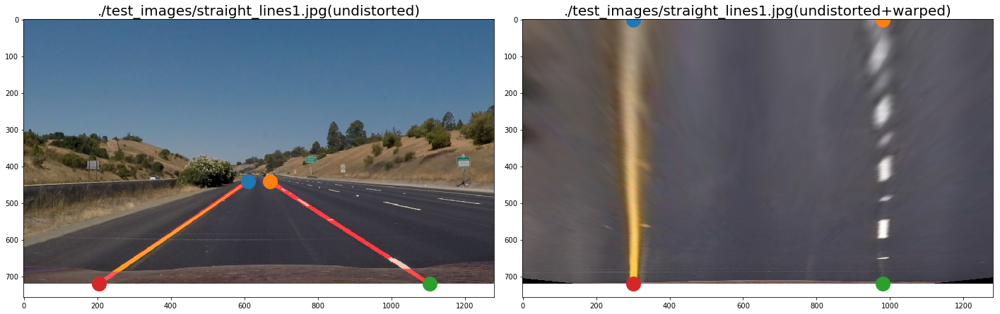

M:
[[   -0.5534    -1.4904   976.1446]
 [   -0.0000    -1.9080   852.8981]
 [   -0.0000    -0.0024     1.0000]]


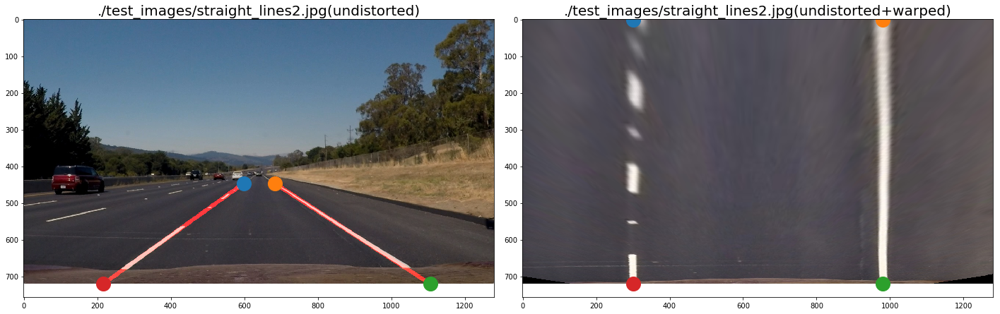

In [55]:
offset = 300 # distance from outer corners of undistorted image to the border in unwarped perspective

# Parameters for ROI selection
roi_height = 0.6
dist_from_side = 0.45 # realtive to image width, max. value: 0.5 -> triangle
ignore_mask_color = 255

# Canny edge detectiion parameters
kernel_size = 3 # for gaussian blur before canny edge detection
canny_low_threshold  = 100
canny_high_threshold = 200

# Parameters for hough line extraction
hough_rho = 1
hough_theta = np.pi / 360
hough_threshold = 20
hough_min_line_len = 30
hough_max_line_gap = 60

# Slope threshold for line filtering and extrapolation
slope_threshold_low  = 0.5
slope_threshold_high = 0.8

straight_lines_files = glob.glob("./test_images/straight*.jpg")


for file in straight_lines_files:
    image = mpimg.imread(file)
    xsize, ysize = img_size = (image.shape[1], image.shape[0])
    
    undist = cv2.undistort(image, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    
    line_img = np.zeros(image.shape, dtype=np.uint8)
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]

    # first smooth image to get better results during edge detection
    img = gaussian_blur(S, kernel_size)
    gray = canny(img, canny_low_threshold, canny_high_threshold)

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),
                          (xsize*dist_from_side,     ysize*roi_height),
                          (xsize*(1-dist_from_side), ysize*roi_height),
                          (xsize,                    ysize)
                         ]], dtype=np.int32)
    masked_img = region_of_interest(gray, vertices)
    
    # extracting straight lines from edges
    lines = cv2.HoughLinesP(masked_img, hough_rho, hough_theta, hough_threshold, np.array([]),
                            hough_min_line_len, hough_max_line_gap)

    lines2 = filter_and_extrapolate_lines(lines, undist, slope_threshold_low, slope_threshold_high, verbose=False)
    draw_lines(line_img, lines2, color=[255, 0, 0], thickness=10)
    
    combined_img = weighted_img(line_img, image)

    left_x1,  left_y1,  left_x2,  left_y2  = lines2[0][0]
    right_x1, right_y1, right_x2, right_y2 = lines2[1][0]
    src = np.array([[left_x1,  left_y1],  [right_x1, right_y1],
                    [right_x2, right_y2], [left_x2,  left_y2]], dtype=np.float32)
    
    dst = np.array([[offset,        0],
                    [xsize-offset,  0], 
                    [xsize-offset,  ysize],
                    [offset,        ysize]], dtype=np.float32)

    M = cv2.getPerspectiveTransform(src, dst)
    print("M:\n%s" % M)
    
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Visualize unwarped image next to the undistorted image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    ax1.imshow(combined_img)
    for coord in src:
        ax1.plot(coord[0], coord[1], 'o', markersize=20)
    ax1.set_title(file + "(undistorted)", fontsize=20)
    
    ax2.imshow(warped)
    for coord in dst:
        ax2.plot(coord[0], coord[1], 'o', markersize=20)
    ax2.set_title(file + "(undistorted+warped)", fontsize=20)

    plt.tight_layout()
    plt.show()

Mean [S]:  0.221929138583  Max [S]:  1.0


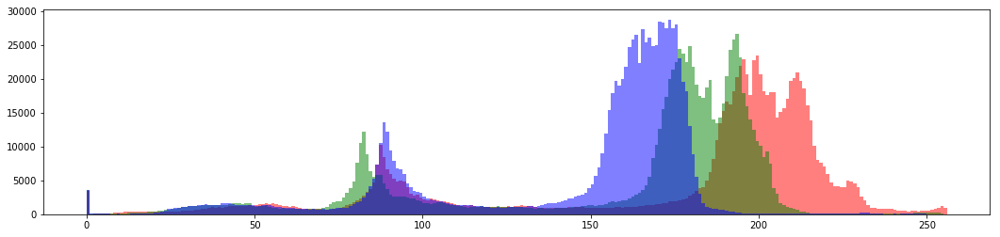

Means:  [  173.7219   157.8644   144.9395]


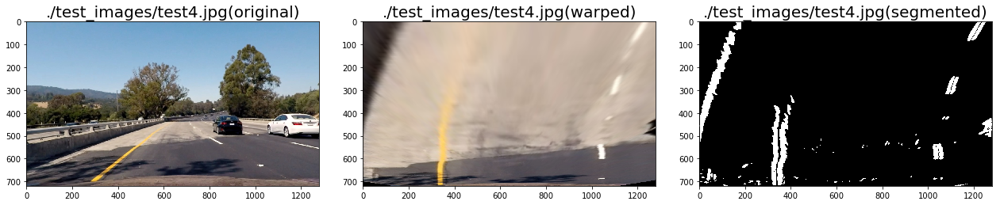

Mean [S]:  0.0744989404616  Max [S]:  1.0


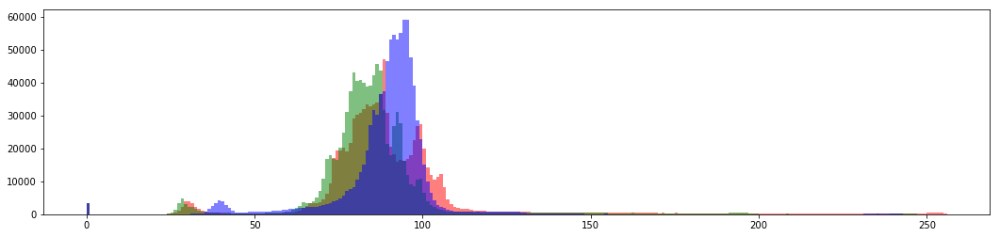

Means:  [   89.9983    84.7539    89.3544]


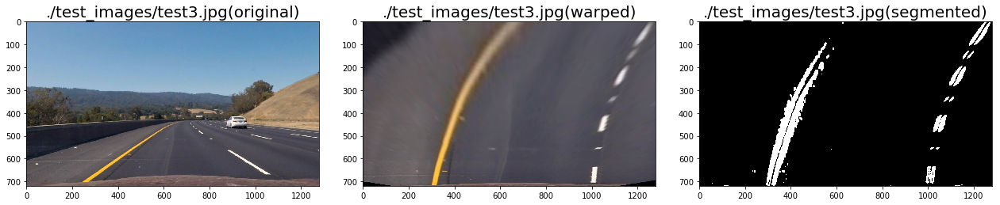

Mean [S]:  0.077825316585  Max [S]:  1.0


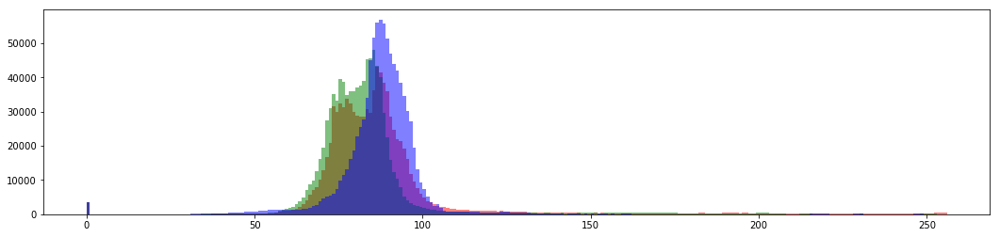

Means:  [   87.6563    82.9357    87.5035]


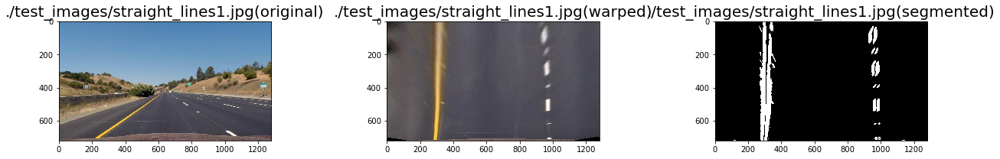

Mean [S]:  0.172249663841  Max [S]:  1.0


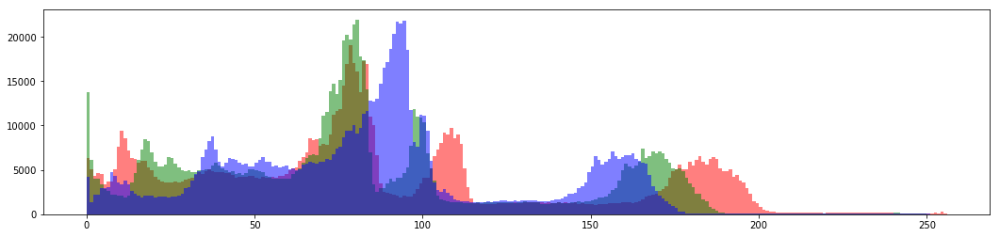

Means:  [   87.7453    82.5425    86.0710]


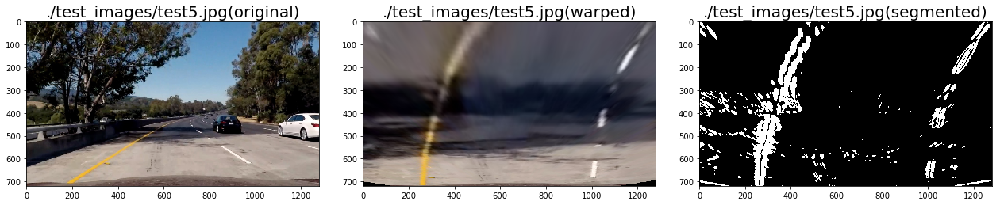

Mean [S]:  0.0590504025395  Max [S]:  1.0


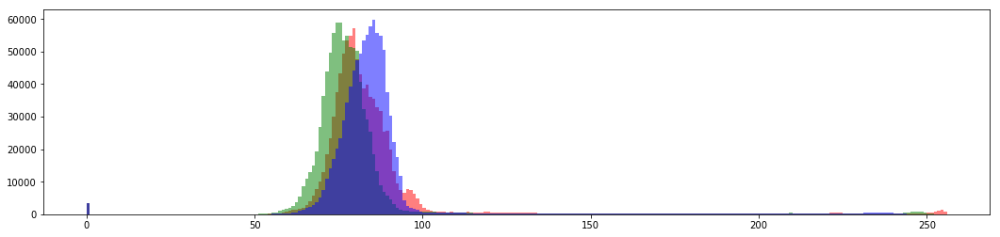

Means:  [   85.2435    80.3571    86.1604]


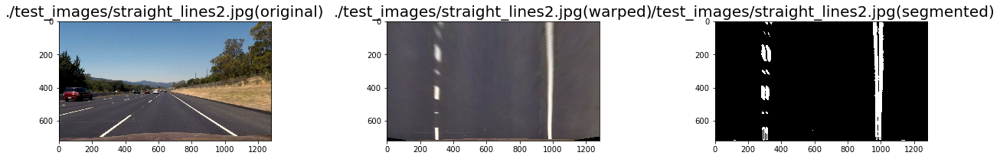

Mean [S]:  0.101680930011  Max [S]:  1.0


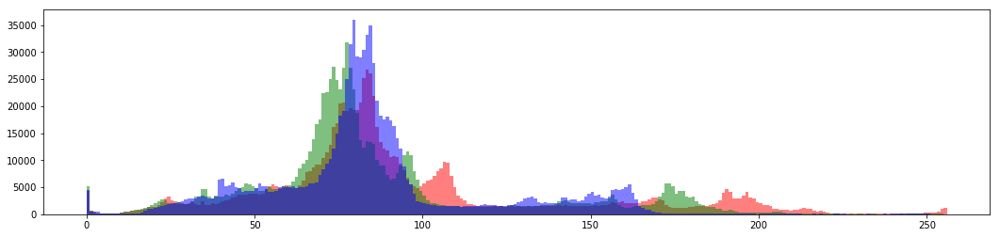

Means:  [   95.5147    86.7941    85.0589]


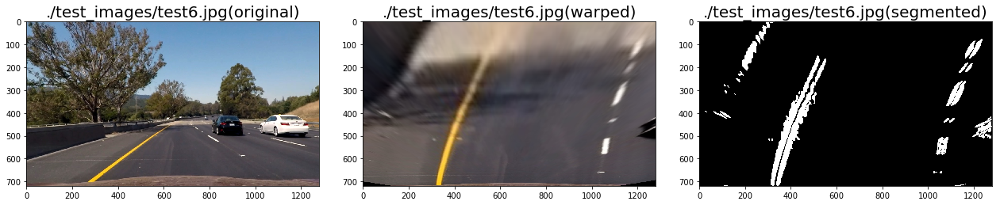

Mean [S]:  0.0666934274578  Max [S]:  1.0


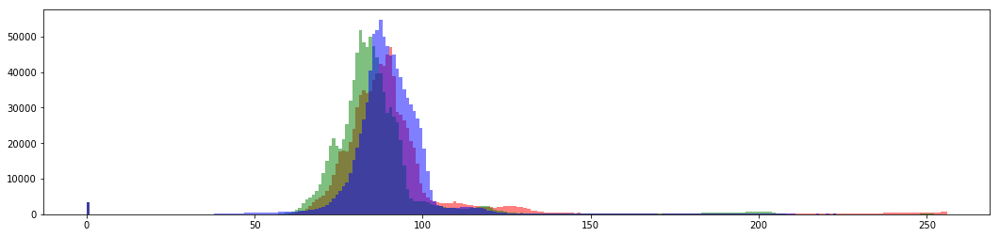

Means:  [   92.4393    86.8652    89.9221]


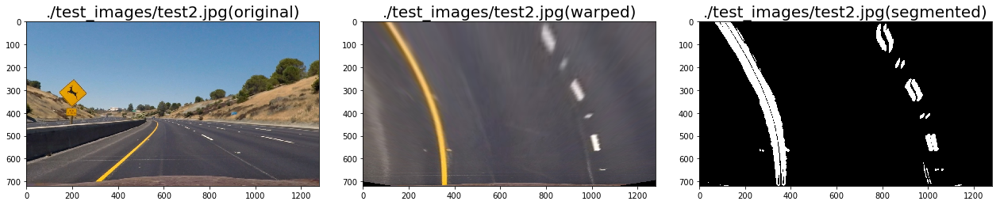

Mean [S]:  0.227369051266  Max [S]:  1.0


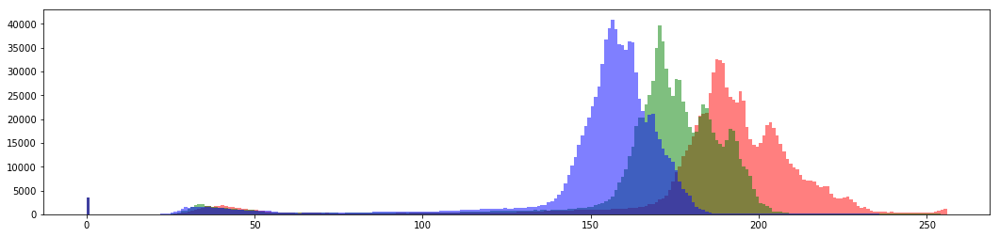

Means:  [  184.9583   167.6078   150.7526]


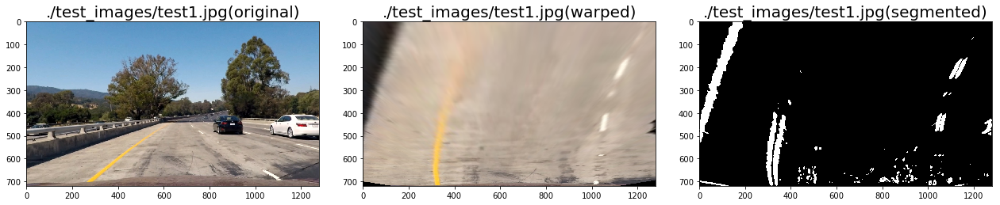

In [59]:
# Choose a Sobel kernel size
ksize = 31 # Choose a larger odd number to smooth gradient measurements
sobel_thresh = (0.11, 0.7)
sobel_mag_thresh = (0.11, 0.7)
sobel_dir_thresh = (np.pi/4, np.pi/2)
hls_s_thresh = (0.5, 1.0)

for file in random.sample(test_files, 8):
    img = mpimg.imread(file)

    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2] / hls[:,:,2].max()
    s_mean = S.mean(axis=(0,1))
    #hls_s_thresh = (s_mean + 0.6, 1.0)
    print("Mean [S]: ", s_mean, " Max [S]: ", S.max(axis=(0,1)))
    segmented = pipeline(warped, sobel_kernel=ksize, s_thresh=hls_s_thresh, sx_thresh=sobel_thresh)
    # Visualize unwarped image next to the undistorted image
    fig = plt.figure(figsize=(18,4))
    #plt.imshow(warped)
    
    plt.hist(warped[:,:,0].ravel(), bins=256, range=[0,256], facecolor='r', alpha=0.5)
    plt.hist(warped[:,:,1].ravel(), bins=256, range=[0,256], facecolor='g', alpha=0.5)
    plt.hist(warped[:,:,2].ravel(), bins=256, range=[0,256], facecolor='b', alpha=0.5)
    plt.show()

    print("Means: ", warped.mean(axis=(0,1)))
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,10))
    
    ax1.imshow(undist)
    ax1.set_title(file + "(original)", fontsize=20)
    
    ax2.imshow(warped, cmap='gray')
    ax2.set_title(file + "(warped)", fontsize=20)
    
    ax3.imshow(segmented, cmap='gray')
    ax3.set_title(file + "(segmented)", fontsize=20)

    plt.tight_layout()
    plt.show()

## Lane detection

Two approaches considered:
* Sliding window with convolutoin
* Histogram

Coefficients for left / right line:  [   -0.0005     0.7298   104.2735] [   -0.0005     0.7376   767.2547]
Curvature (left/right): 1139.7m / 1121.4m
diff of quadratic coeff:  9.16899442108e-06
diff of linear coeff:     -0.00780618448507


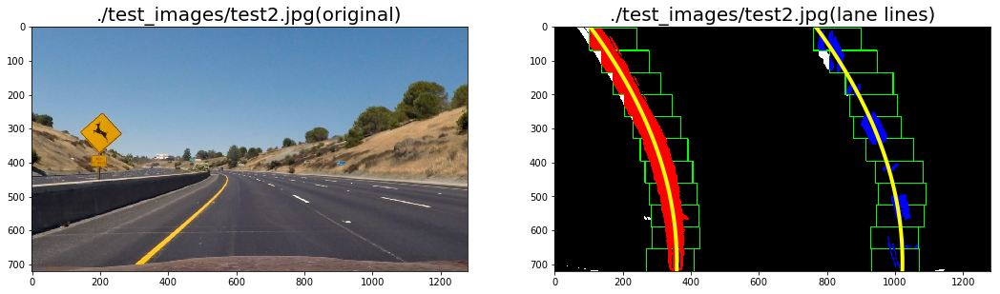

Coefficients for left / right line:  [    0.0006    -0.7975   580.7730] [    0.0007    -0.7638  1260.0809]
Curvature (left/right): 978.4m / 850.8m
diff of quadratic coeff:  -5.01272207547e-05
diff of linear coeff:     -0.0336290558087


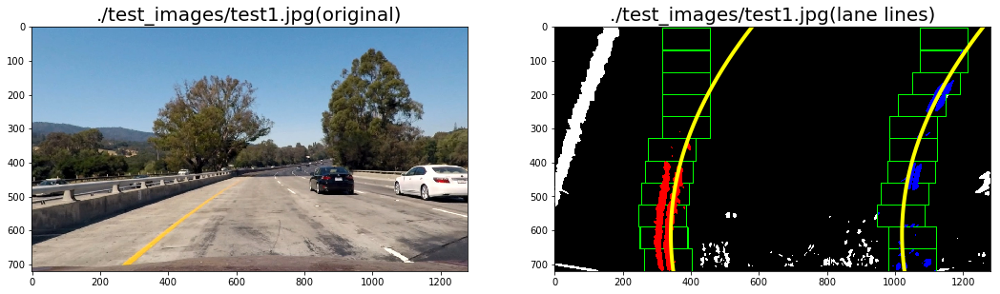

Coefficients for left / right line:  [   -0.0000     0.0006   311.5688] [   -0.0001     0.0818   942.9349]
Curvature (left/right): 15089.0m / 9673.5m
diff of quadratic coeff:  1.8676887892e-05
diff of linear coeff:     -0.0811923041866


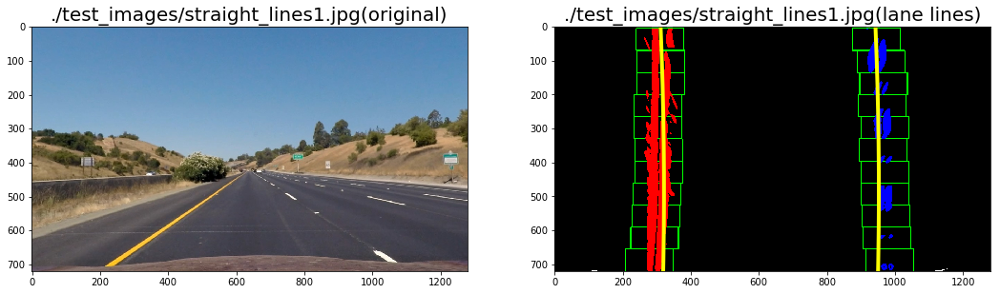

Coefficients for left / right line:  [    0.0001    -0.0576   316.1462] [   -0.0001     0.0362   977.6025]
Curvature (left/right): 9785.8m / 9859.3m
diff of quadratic coeff:  0.000101841048784
diff of linear coeff:     -0.0937525285045


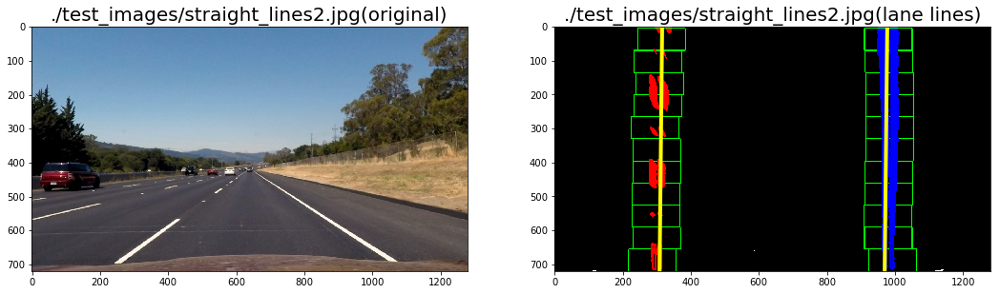

Coefficients for left / right line:  [    0.0002    -0.3466   466.2054] [    0.0005    -0.5866  1232.8450]
Curvature (left/right): 2169.9m / 1212.7m
diff of quadratic coeff:  -0.000213723516247
diff of linear coeff:     0.240010799982


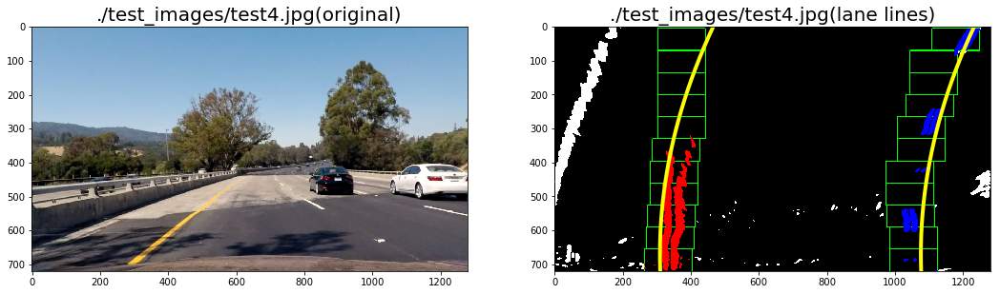

Coefficients for left / right line:  [    0.0003    -0.6247   633.3648] [    0.0003    -0.5301  1258.2156]
Curvature (left/right): 2314.3m / 1813.1m
diff of quadratic coeff:  -3.75453001297e-05
diff of linear coeff:     -0.094584704025


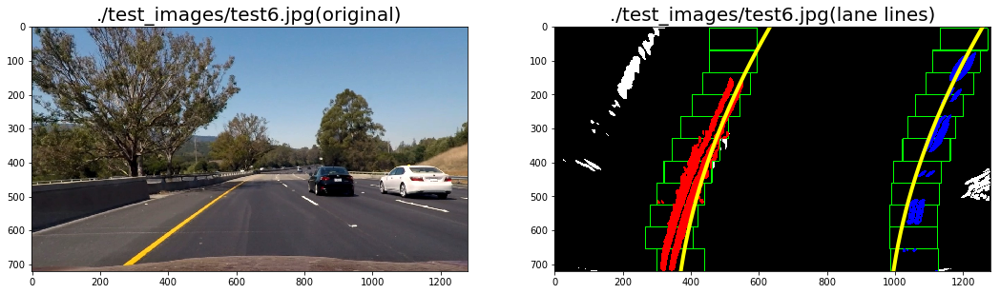

Coefficients for left / right line:  [    0.0004    -0.6286   491.2062] [    0.0005    -0.7383  1262.1523]
Curvature (left/right): 1316.5m / 1092.3m
diff of quadratic coeff:  -0.000105749028872
diff of linear coeff:     0.109619188841


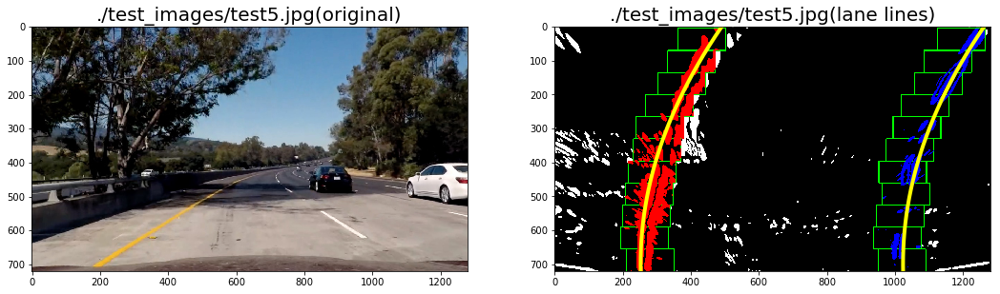

Coefficients for left / right line:  [    0.0003    -0.6573   615.8360] [    0.0004    -0.6586  1261.6637]
Curvature (left/right): 1861.6m / 1405.5m
diff of quadratic coeff:  -8.43405665077e-05
diff of linear coeff:     0.00130847573769


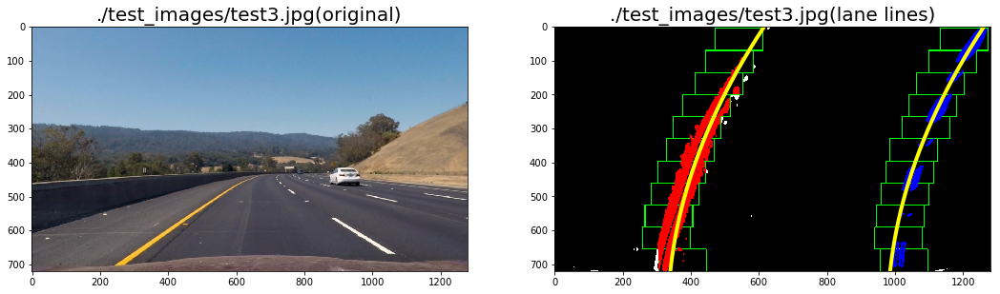

In [176]:
class lane_detection():
    def __init__(self, config):
        """
        Params:
            nr_windows
                number of sliding windows    

            margin
                width of the windows +/- margin

            minpix
                minimum number of pixels found to recenter window
        """
        self.set_config(config)


    def set_config(self, config):
        if "nr_windows" in config:
            self.nr_windows=config["nr_windows"]
        else:
            self.nr_windows=10

        if "margin" in config:
            self.margin=config["margin"]
        else:
            self.margin=100
        
        if "minpix" in config:
            self.minpix=config["minpix"]
        else:
            self.minpix=50
        
        self.left_fit  = None
        self.right_fit = None
        self.window_width = 100 


    def window_mask(self, width, height, img_ref, center, level):
        output = np.zeros_like(img_ref)
        interval_left  = int(img_ref.shape[0] - (level+1)*height)
        interval_right = int(img_ref.shape[0] - level*height)
        output[interval_left:interval_right, max(0, center-width//2):min(center+width//2, img_ref.shape[1])] = 1
        return output


    def find_window_centroids(self, image):
        window_height = image.shape[0] // self.nr_windows # Break image into 9 vertical layers since image height is 720
        
        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(self.window_width) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
        l_center = int(np.argmax(np.convolve(window,l_sum))-self.window_width/2)
        r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
        r_center = int(np.argmax(np.convolve(window,r_sum))-self.window_width/2+int(image.shape[1]/2))

        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(image.shape[0]/window_height)):
            # convolve the window into the vertical slice of the image
            interval_left  = int(image.shape[0]-(level+1)*window_height)
            interval_right = int(image.shape[0]-level*window_height)
            image_layer = np.sum(image[interval_left:interval_right,:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use self.window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = self.window_width/2
            l_min_index = int(max(l_center+offset-margin,0))
            l_max_index = int(min(l_center+offset+margin,image.shape[1]))
            l_center    = int(np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset)
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-margin,0))
            r_max_index = int(min(r_center+offset+margin,image.shape[1]))
            r_center    = int(np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset)
            # Add what we found for that layer
            window_centroids.append((l_center, r_center))

        return window_centroids

    
    def out_image(self, image):
        window_centroids = self.find_window_centroids(image)
        window_height = image.shape[0] // self.nr_windows # Break image into 9 vertical layers since image height is 720
        # If we found any window centers
        if len(window_centroids) > 0:

            # Points used to draw all the left and right windows
            l_points = np.zeros_like(image)
            r_points = np.zeros_like(image)

            # Go through each level and draw the windows 
            for level in range(len(window_centroids)):
                # Window_mask is a function to draw window areas
                l_mask = self.window_mask(self.window_width, window_height, image, window_centroids[level][0], level)
                r_mask = self.window_mask(self.window_width, window_height, image, window_centroids[level][1], level)
                # Add graphic points from window mask here to total pixels found 
                l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
                r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

            # Draw the results
            template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
            zero_channel = np.zeros_like(template) # create a zero color channel
            template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
            warpage= np.dstack((image, image, image))*255 # making the original road pixels 3 color channels
            output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

        # If no window centers found, just display orginal road image
        else:
            output = np.array(cv2.merge((warped, warped, warped)), np.uint8)

        return output


    def fit_lane_line(self, binary_warped, reuse_last_fit=False):

        # Identify the x and y positions of all nonzero pixels in the image
        nonzero  = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255 
        
        # we can only reuse our last fit if there exists one!
        if reuse_last_fit and not (self.left_fit != None) and (self.right_fit != None):
            left_lane_inds  = ((nonzerox > (np.polyval(self.left_fit, nonzeroy) - self.margin)) &
                               (nonzerox < (np.polyval(self.left_fit, nonzeroy) + self.margin)))

            right_lane_inds = ((nonzerox > (np.polyval(self.right_fit, nonzeroy) - self.margin)) &
                               (nonzerox < (np.polyval(self.right_fit, nonzeroy) + self.margin)))
        else:
            
            # Take a histogram of the bottom half of the image as a starting point to find the lanes
            histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

            # Find the peak of the left and right halves of the histogram
            # These will be the starting point for the left and right lines
            midpoint    = histogram.shape[0] // 2
            leftx_base  = np.argmax(histogram[:midpoint])
            rightx_base = np.argmax(histogram[midpoint:]) + midpoint

            # Set height of windows
            window_height = binary_warped.shape[0] // self.nr_windows

            # Current positions to be updated for each window
            leftx_current  = leftx_base
            rightx_current = rightx_base

            # Create empty lists to receive left and right lane pixel indices
            left_lane_inds  = []
            right_lane_inds = []

            # Step through the windows one by one
            for window in range(self.nr_windows):
                # Identify window boundaries in x and y (and right and left)
                win_y_low  = binary_warped.shape[0] - (window+1)*window_height
                win_y_high = binary_warped.shape[0] - window*window_height
                win_xleft_low = leftx_current - self.margin
                win_xleft_high = leftx_current + self.margin
                win_xright_low = rightx_current - self.margin
                win_xright_high = rightx_current + self.margin
                # Draw the windows on the visualization image
                cv2.rectangle(out_img, (win_xleft_low,  win_y_low), (win_xleft_high,  win_y_high),  (0,255,0), 2) 
                cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high),  (0,255,0), 2) 
                # Identify the nonzero pixels in x and y within the window
                good_left_inds = ((nonzeroy >= win_y_low)       & (nonzeroy < win_y_high) & 
                                  (nonzerox >= win_xleft_low)   & (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low)      & (nonzeroy < win_y_high) & 
                                   (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
                # Append these indices to the lists
                left_lane_inds.append(good_left_inds)
                right_lane_inds.append(good_right_inds)
                # If you found > minpix pixels, recenter next window on their mean position
                if len(good_left_inds) > self.minpix:
                    leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
                if len(good_right_inds) > self.minpix:        
                    rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

            # Concatenate the arrays of indices
            left_lane_inds  = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx  = nonzerox[left_lane_inds]
        lefty  = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        self.left_fit  = np.polyfit(lefty, leftx, 2)
        self.right_fit = np.polyfit(righty, rightx, 2)
        
        out_img[nonzeroy[left_lane_inds],  nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        if reuse_last_fit:
            # Generate a polygon to illustrate the search window area
            # And recast the x and y points into usable format for cv2.fillPoly()
            left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
            left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                          ploty])))])
            left_line_pts = np.hstack((left_line_window1, left_line_window2))
            right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
            right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                          ploty])))])
            right_line_pts = np.hstack((right_line_window1, right_line_window2))

            # Draw the lane onto the warped blank image
            cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
            cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
            out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)


        return (self.left_fit, self.right_fit, out_img)


segmentation_config = {
    "ksize"              : 31,
    "sobel_thresh"       : (0.11, 0.7),
    "sobel_mag_thresh"   : (0.11, 0.7),
    "sobel_dir_thresh"   : (np.pi/4, np.pi/2),
    "hls_s_thresh"       : (0.6, 1.0)
}

lane_detection_config = {
    "nr_windows" : 11,
    "margin"     : 70,
    "minpix"     : 50
}

test_files_lane_detection = glob.glob("./test_images/straight*.jpg")
segm = segmentation(segmentation_config)
detect_lanes = lane_detection(lane_detection_config)

for file in random.sample(test_files, 8): #test_files_lane_detection:
    img = mpimg.imread(file)
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    binary_warped = segm.run_pipeline(warped)
    #out_img = detect_lanes.out_image(binary_warped)
    
    left_fit, right_fit, out_img = detect_lanes.fit_lane_line(binary_warped)
    print("Coefficients for left / right line: ", left_fit, right_fit)
    
    y_eval = img.shape[0] // 2 # evaluate curvature in the image center
    left_curverad  = ((1 + (2*left_fit[0]*y_eval  + left_fit[1])**2)**1.5)  / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    print("Curvature (left/right): %.1fm / %.1fm" % (left_curverad, right_curverad))
        
    # The quadratic and linear coefficients of the fits have to match between the left and right lane!
    # Let's average them to make the lane fits more robust
    print("diff of quadratic coeff: ", left_fit[0] - right_fit[0])
    print("diff of linear coeff:    ", left_fit[1] - right_fit[1])
    left_fit[0] = right_fit[0] = np.average([left_fit[0], right_fit[0]])
    left_fit[1] = right_fit[1] = np.average([left_fit[1], right_fit[1]])

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx  = np.polyval(left_fit, ploty)
    right_fitx = np.polyval(right_fit, ploty)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,10))
    
    ax1.imshow(undist)
    ax1.set_title(file + "(original)", fontsize=20)
    
    ax2.imshow(out_img)
    ax2.plot(left_fitx, ploty, color='yellow', linewidth=4)
    ax2.plot(right_fitx, ploty, color='yellow', linewidth=4)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    ax2.set_title(file + "(lane lines)", fontsize=20)
    
    plt.show()